In [1]:

!pip install -q transformers==4.41.0 diffusers accelerate
!pip install -q groundingdino-py
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 40.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 11.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
# BENCHMARK DATASET CONSTRUCTION
# 50 content images × 2 regions × 2 style refs

import os
import json
import re
import requests
import numpy as np
from PIL import Image
from io import BytesIO
from datetime import datetime

for d in ['content', 'styles', 'masks', 'metadata']:
    os.makedirs(f'/content/benchmark/{d}', exist_ok=True)

def download_image(url, path, size=(512, 512)):
    try:
        r = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=15)
        img = Image.open(BytesIO(r.content)).convert('RGB')
        if size:
            img = img.resize(size, Image.LANCZOS)
        img.save(path)
        return True
    except Exception as e:
        print(f'Failed {url}: {e}')
        return False

print('Benchmark directories created')

Benchmark directories created


In [3]:
CONTENT_IMAGES = [
    # Landscapes
    {"id":"L001","category":"landscape","url":"https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Van Gogh and the mountains like Monet"},
    {"id":"L002","category":"landscape","url":"https://images.unsplash.com/photo-1501854140801-50d01698950b?w=512&q=80","regions":["sky","forest"],   "instruction":"style the sky like Picasso and the forest like Van Gogh"},
    {"id":"L003","category":"landscape","url":"https://images.unsplash.com/photo-1470770903676-69b98201ea1c?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Monet and the water like Van Gogh"},
    {"id":"L004","category":"landscape","url":"https://images.unsplash.com/photo-1464822759023-fed622ff2c3b?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Feathers and the mountains like Picasso"},
    {"id":"L005","category":"landscape","url":"https://images.unsplash.com/photo-1500534314209-a25ddb2bd429?w=512&q=80","regions":["sky","forest"],   "instruction":"style the sky like Van Gogh and the forest like Monet"},
    {"id":"L006","category":"landscape","url":"https://images.unsplash.com/photo-1426604966848-d7adac402bff?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Picasso and the water like Feathers"},
    {"id":"L007","category":"landscape","url":"https://images.unsplash.com/photo-1472214103451-9374bd1c798e?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Monet and the mountains like Van Gogh"},
    {"id":"L008","category":"landscape","url":"https://images.unsplash.com/photo-1447752875215-b2761acb3c5d?w=512&q=80","regions":["sky","forest"],   "instruction":"style the sky like Feathers and the forest like Monet"},
    {"id":"L009","category":"landscape","url":"https://images.unsplash.com/photo-1433086966358-54859d0ed716?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Van Gogh and the water like Picasso"},
    {"id":"L010","category":"landscape","url":"https://images.unsplash.com/photo-1518098268026-4e89f1a2cd8e?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Monet and the mountains like Feathers"},

    # Cityscapes
    {"id":"C001","category":"cityscape","url":"https://images.unsplash.com/photo-1477959858617-67f85cf4f1df?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Van Gogh and the buildings like Picasso"},
    {"id":"C002","category":"cityscape","url":"https://images.unsplash.com/photo-1480714378408-67cf0d13bc1b?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Monet and the buildings like Van Gogh"},
    {"id":"C003","category":"cityscape","url":"https://images.unsplash.com/photo-1486325212027-8081e485255e?w=512&q=80","regions":["sky","street"],   "instruction":"style the sky like Feathers and the street like Monet"},
    {"id":"C004","category":"cityscape","url":"https://images.unsplash.com/photo-1444723121867-7a241cacace9?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Picasso and the buildings like Feathers"},
    {"id":"C005","category":"cityscape","url":"https://images.unsplash.com/photo-1449824913935-59a10b8d2000?w=512&q=80","regions":["sky","street"],   "instruction":"style the sky like Van Gogh and the street like Picasso"},
    {"id":"C006","category":"cityscape","url":"https://images.unsplash.com/photo-1519501025264-65ba15a82390?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Monet and the buildings like Feathers"},
    {"id":"C007","category":"cityscape","url":"https://images.unsplash.com/photo-1477959858617-67f85cf4f1df?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Feathers and the buildings like Van Gogh"},
    {"id":"C008","category":"cityscape","url":"https://images.unsplash.com/photo-1494522855154-9297ac14b55f?w=512&q=80","regions":["sky","street"],   "instruction":"style the sky like Picasso and the street like Monet"},
    {"id":"C009","category":"cityscape","url":"https://images.unsplash.com/photo-1534430480872-3498386e7856?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Van Gogh and the buildings like Monet"},
    {"id":"C010","category":"cityscape","url":"https://images.unsplash.com/photo-1501594907352-04cda38ebc29?w=512&q=80","regions":["sky","buildings"],"instruction":"style the sky like Feathers and the buildings like Picasso"},

    # Nature
    {"id":"N001","category":"nature","url":"https://images.unsplash.com/photo-1448375240586-882707db888b?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Van Gogh and the trees like Monet"},
    {"id":"N002","category":"nature","url":"https://images.unsplash.com/photo-1518173946687-a4c8892bbd9f?w=512&q=80","regions":["water","rocks"],"instruction":"style the water like Monet and the rocks like Picasso"},
    {"id":"N003","category":"nature","url":"https://images.unsplash.com/photo-1441974231531-c6227db76b6e?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Feathers and the trees like Van Gogh"},
    {"id":"N004","category":"nature","url":"https://images.unsplash.com/photo-1475924156734-496f6cac6ec1?w=512&q=80","regions":["water","rocks"],"instruction":"style the water like Van Gogh and the rocks like Feathers"},
    {"id":"N005","category":"nature","url":"https://images.unsplash.com/photo-1504700610630-ac6aba3536d3?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Picasso and the trees like Monet"},
    {"id":"N006","category":"nature","url":"https://images.unsplash.com/photo-1465146344425-f00d5f5c8f07?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Monet and the trees like Feathers"},
    {"id":"N007","category":"nature","url":"https://images.unsplash.com/photo-1418065460487-3e41a6c84dc5?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Van Gogh and the trees like Picasso"},
    {"id":"N008","category":"nature","url":"https://images.unsplash.com/photo-1476820865390-c52aeebb9891?w=512&q=80","regions":["water","rocks"],"instruction":"style the water like Feathers and the rocks like Monet"},
    {"id":"N009","category":"nature","url":"https://images.unsplash.com/photo-1500534314209-a25ddb2bd429?w=512&q=80","regions":["sky","trees"], "instruction":"style the sky like Monet and the trees like Van Gogh"},
    {"id":"N010","category":"nature","url":"https://images.unsplash.com/photo-1504198266287-1659872e6590?w=512&q=80","regions":["water","rocks"],"instruction":"style the water like Picasso and the rocks like Van Gogh"},

    # Sunsets
    {"id":"S001","category":"sunset","url":"https://images.unsplash.com/photo-1507003211169-0a1dd7228f2d?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Van Gogh and the water like Monet"},
    {"id":"S002","category":"sunset","url":"https://images.unsplash.com/photo-1495616811223-4d98c6e9c869?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Feathers and the water like Picasso"},
    {"id":"S003","category":"sunset","url":"https://images.unsplash.com/photo-1504701954957-2010ec3bcec1?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Monet and the water like Van Gogh"},
    {"id":"S004","category":"sunset","url":"https://images.unsplash.com/photo-1508739773434-c26b3d09e071?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Picasso and the water like Feathers"},
    {"id":"S005","category":"sunset","url":"https://images.unsplash.com/photo-1500534314209-a25ddb2bd429?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Van Gogh and the mountains like Picasso"},
    {"id":"S006","category":"sunset","url":"https://images.unsplash.com/photo-1454372182658-c712e4c5a1db?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Monet and the water like Feathers"},
    {"id":"S007","category":"sunset","url":"https://images.unsplash.com/photo-1511300636408-a63a89df3482?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Feathers and the water like Van Gogh"},
    {"id":"S008","category":"sunset","url":"https://images.unsplash.com/photo-1490730141103-6cac27aaab94?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Van Gogh and the water like Feathers"},
    {"id":"S009","category":"sunset","url":"https://images.unsplash.com/photo-1505118380757-91f5f5632de0?w=512&q=80","regions":["sky","mountains"],"instruction":"style the sky like Picasso and the mountains like Monet"},
    {"id":"S010","category":"sunset","url":"https://images.unsplash.com/photo-1470252649378-9c29740c9fa8?w=512&q=80","regions":["sky","water"],    "instruction":"style the sky like Monet and the water like Picasso"},

    # Winter
    {"id":"W001","category":"winter","url":"https://images.unsplash.com/photo-1418985991508-e47386d96a71?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Van Gogh and the snow like Monet"},
    {"id":"W002","category":"winter","url":"https://images.unsplash.com/photo-1491002052546-bf38f186af56?w=512&q=80","regions":["sky","trees"],"instruction":"style the sky like Feathers and the trees like Picasso"},
    {"id":"W003","category":"winter","url":"https://images.unsplash.com/photo-1516912481808-3406841bd33c?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Monet and the snow like Van Gogh"},
    {"id":"W004","category":"winter","url":"https://images.unsplash.com/photo-1467746474745-41dd2c7524ce?w=512&q=80","regions":["sky","trees"],"instruction":"style the sky like Picasso and the trees like Feathers"},
    {"id":"W005","category":"winter","url":"https://images.unsplash.com/photo-1457269449834-928af64c684d?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Van Gogh and the snow like Picasso"},
    {"id":"W006","category":"winter","url":"https://images.unsplash.com/photo-1486870591958-9b9d0d1dda99?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Feathers and the snow like Monet"},
    {"id":"W007","category":"winter","url":"https://images.unsplash.com/photo-1551582045-6ec9c11d8697?w=512&q=80","regions":["sky","trees"],"instruction":"style the sky like Monet and the trees like Van Gogh"},
    {"id":"W008","category":"winter","url":"https://images.unsplash.com/photo-1462275646964-a0e3386b89fa?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Picasso and the snow like Van Gogh"},
    {"id":"W009","category":"winter","url":"https://images.unsplash.com/photo-1453791052107-5c843da62d97?w=512&q=80","regions":["sky","trees"],"instruction":"style the sky like Van Gogh and the trees like Feathers"},
    {"id":"W010","category":"winter","url":"https://images.unsplash.com/photo-1517299321609-52687d1bc55a?w=512&q=80","regions":["sky","snow"], "instruction":"style the sky like Monet and the snow like Feathers"},
]

print(f'{len(CONTENT_IMAGES)} images defined')

50 images defined


In [4]:
STYLE_IMAGES = {
    "Van Gogh": "https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/mosaic.jpg",
    "Monet":"https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/candy.jpg",
    "Picasso":"https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/udnie.jpg",
    "Feathers": "https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/rain-princess.jpg",
}

for name, url in STYLE_IMAGES.items():
    path = f'/content/benchmark/styles/{name.replace(" ", "_")}.jpg'
    if download_image(url, path):
        print(f'  {name} ok')

style_ref_map = {
    name: Image.open(f'/content/benchmark/styles/{name.replace(" ", "_")}.jpg').convert('RGB').resize((512, 512), Image.LANCZOS)
    for name in STYLE_IMAGES
}
print(f'{len(style_ref_map)} styles ready')

  Van Gogh ok
  Monet ok
  Picasso ok
  Feathers ok
4 styles ready


In [5]:
print(f'Downloading {len(CONTENT_IMAGES)} content images...')
failed = []

for item in CONTENT_IMAGES:
    path = f'/content/benchmark/content/{item["id"]}.jpg'
    if os.path.exists(path):
        print(f'  {item["id"]} already exists, skipping')
        continue
    ok = download_image(item['url'], path)
    print(f'  {"ok" if ok else "FAILED"} {item["id"]} ({item["category"]})')
    if not ok:
        failed.append(item['id'])

print(f'\nDownloaded: {len(CONTENT_IMAGES) - len(failed)}/{len(CONTENT_IMAGES)}')
if failed:
    print(f'Failed: {failed}')

  ok L001 (landscape)
  ok L002 (landscape)
  ok L003 (landscape)
  ok L004 (landscape)
  ok L005 (landscape)
  ok L006 (landscape)
  ok L007 (landscape)
  ok L008 (landscape)
  ok L009 (landscape)
  ok L010 (landscape)
  ok C001 (cityscape)
  ok C002 (cityscape)
  ok C003 (cityscape)
  ok C004 (cityscape)
  ok C005 (cityscape)
  ok C006 (cityscape)
  ok C007 (cityscape)
  ok C008 (cityscape)
  ok C009 (cityscape)
  ok C010 (cityscape)
  ok N001 (nature)
  ok N002 (nature)
  ok N003 (nature)
  ok N004 (nature)
  ok N005 (nature)
  ok N006 (nature)
  ok N007 (nature)
  ok N008 (nature)
  ok N009 (nature)
  ok N010 (nature)
  ok S001 (sunset)
  ok S002 (sunset)
  ok S003 (sunset)
  ok S004 (sunset)
  ok S005 (sunset)
  ok S006 (sunset)
  ok S007 (sunset)
  ok S008 (sunset)
  ok S009 (sunset)
  ok S010 (sunset)
  ok W001 (winter)
  ok W002 (winter)
  ok W003 (winter)
  ok W004 (winter)
  ok W005 (winter)
  ok W006 (winter)
  ok W007 (winter)
  ok W008 (winter)
  ok W009 (winter)
  ok W010

In [6]:
import os
import importlib
import torch
import numpy as np
import transformers
import torch.nn as nn
from PIL import Image

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

if importlib.util.find_spec('groundingdino') is None:
    !pip install -q groundingdino-py
if importlib.util.find_spec('segment_anything') is None:
    !pip install -q git+https://github.com/facebookresearch/segment-anything.git

if not os.path.exists('/content/gdino.pth'):
    !wget -q -O /content/gdino.pth https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
if not os.path.exists('/content/gdino_config.py'):
    !wget -q -O /content/gdino_config.py https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py
if not os.path.exists('/content/sam_vit_h.pth'):
    !wget -q -O /content/sam_vit_h.pth https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

# Patch for newer transformers versions that dropped get_head_mask from BertModel
if not hasattr(transformers.models.bert.modeling_bert.BertModel, 'get_head_mask'):
    def get_head_mask(self, head_mask, num_hidden_layers, is_attention_chunked=False):
        if head_mask is not None:
            head_mask = self._convert_head_mask_to_5d(head_mask, num_hidden_layers)
            if is_attention_chunked:
                head_mask = head_mask.unsqueeze(-1)
        else:
            head_mask = [None] * num_hidden_layers
        return head_mask
    transformers.models.bert.modeling_bert.BertModel.get_head_mask = get_head_mask

from groundingdino.util.inference import load_model
gdino_model = load_model('/content/gdino_config.py', '/content/gdino.pth')
print('Grounding DINO loaded')

from segment_anything import sam_model_registry, SamPredictor
sam = sam_model_registry['vit_h'](checkpoint='/content/sam_vit_h.pth').to(DEVICE)
sam_predictor = SamPredictor(sam)
print('SAM loaded')

Device: cuda


/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4381.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Grounding DINO loaded
SAM loaded


Device: cuda
Loading SegFormer...


preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/segformer/image_processing_segformer.py:103: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/110M [00:00<?, ?B/s]

SegFormer loaded


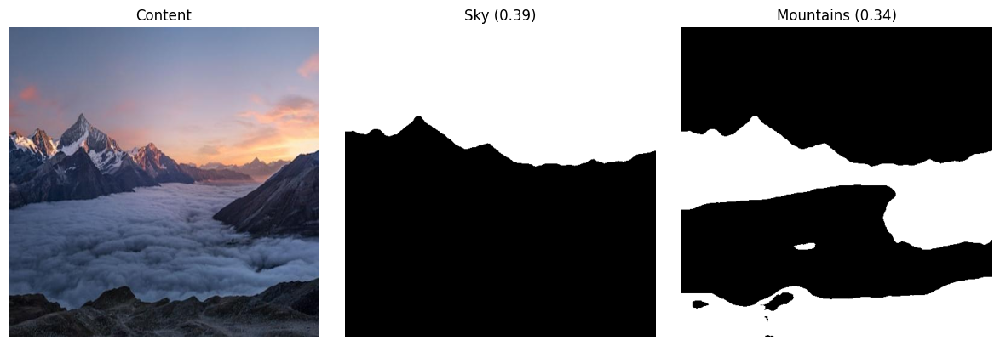

SegFormer working


In [7]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

# ADE20K class indices for the regions we care about
ADE20K_LABELS = {
    'sky': 2, 'mountains': 16, 'mountain': 16,
    'water': 21, 'sea': 21, 'forest': 4,
    'trees': 4, 'tree': 4, 'buildings': 0,
    'building': 0, 'street': 6, 'road': 6,
    'rocks': 16, 'rock': 16, 'snow': 94, 'ground': 13,
}

print('Loading SegFormer...')
processor = SegformerImageProcessor.from_pretrained('nvidia/segformer-b2-finetuned-ade-512-512')
seg_model = SegformerForSemanticSegmentation.from_pretrained(
    'nvidia/segformer-b2-finetuned-ade-512-512'
).to(DEVICE)
seg_model.eval()
print('SegFormer loaded')

def positional_fallback(H, W, region_name):
    mask = np.zeros((H, W), dtype=np.uint8)
    if 'sky' in region_name.lower():
        mask[:int(H * 0.4), :] = 255
    else:
        mask[int(H * 0.5):, :] = 255
    return mask

def text_to_mask_seg(image_pil, region_name, min_coverage=0.02):
    inputs = processor(images=image_pil, return_tensors='pt').to(DEVICE)
    with torch.no_grad():
        outputs = seg_model(**inputs)

    upsampled = torch.nn.functional.interpolate(
        outputs.logits, size=(image_pil.size[1], image_pil.size[0]),
        mode='bilinear', align_corners=False
    )
    seg_map = upsampled.argmax(dim=1)[0].cpu().numpy()
    H, W = seg_map.shape
    label_idx = ADE20K_LABELS.get(region_name.lower().strip())

    if label_idx is None:
        print(f'"{region_name}" not in label map — positional fallback')
        return positional_fallback(H, W, region_name)

    mask = (seg_map == label_idx).astype(np.uint8) * 255
    if (mask > 0).mean() < min_coverage:
        print(f'    Low coverage for "{region_name}" — positional fallback')
        return positional_fallback(H, W, region_name)

    return mask

# Quick sanity check on L001
test_img = Image.open('/content/benchmark/content/L001.jpg').convert('RGB').resize((512, 512))
mask_sky = text_to_mask_seg(test_img,'sky')
mask_mtn = text_to_mask_seg(test_img,'mountains')

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(test_img);               axes[0].set_title('Content');axes[0].axis('off')
axes[1].imshow(mask_sky,  cmap='gray'); axes[1].set_title(f'Sky ({(mask_sky > 0).mean():.2f})');axes[1].axis('off')
axes[2].imshow(mask_mtn,  cmap='gray'); axes[2].set_title(f'Mountains ({(mask_mtn > 0).mean():.2f})'); axes[2].axis('off')
plt.tight_layout()
plt.show()
print('SegFormer working')

In [8]:

import cv2
import groundingdino.datasets.transforms as T_gdino
from groundingdino.util.inference import predict

def run_sam(predictor, image_pil, boxes_px):
    img_np = np.array(image_pil.convert('RGB'))
    predictor.set_image(img_np)
    combined = np.zeros((img_np.shape[0], img_np.shape[1]),dtype=np.uint8)
    for box in boxes_px:
        masks_sam, _, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=np.array(box, dtype=np.float32)[None, :],  # SAM expects shape (1, 4)
            multimask_output=False,
        )
        combined = np.maximum(combined, (masks_sam[0] * 255).astype(np.uint8))
    return combined

gdino_transform = T_gdino.Compose([
    T_gdino.RandomResize([800], max_size=1333),
    T_gdino.ToTensor(),
    T_gdino.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

dataset_records = []
failed_samples = []

for idx, item in enumerate(CONTENT_IMAGES):
    img_path  = f'/content/benchmark/content/{item["id"]}.jpg'
    meta_path = f'/content/benchmark/metadata/{item["id"]}.json'

    if os.path.exists(meta_path):
        with open(meta_path) as f:
            dataset_records.append(json.load(f))
        print(f'{item["id"]} already processed, skipping')
        continue

    if not os.path.exists(img_path):
        print(f'  {item["id"]} image missing — skipping')
        failed_samples.append(item['id'])
        continue

    print(f'\n[{idx+1}/{len(CONTENT_IMAGES)}] {item["id"]} — {item["instruction"]}')

    try:
        content_img = Image.open(img_path).convert('RGB').resize((512, 512), Image.LANCZOS)
        W, H = content_img.size
        img_t, _ = gdino_transform(content_img, None)

        record = {
            "id":item["id"],
            "category":item["category"],
            "instruction":item["instruction"],
            "image_path":img_path,
            "regions":[],
            "created_at":datetime.now().isoformat(),
        }

        for region_name in item["regions"]:
            # Try standard threshold first, fall back if nothing detected
            boxes, scores = None, None
            for threshold in [0.3, 0.15]:
                boxes, scores, _ = predict(
                    model=gdino_model, image=img_t, caption=region_name,
                    box_threshold=threshold, text_threshold=threshold,
                )
                if len(boxes) > 0:
                    break

            if boxes is None or len(boxes) == 0:
                print(f'no box for "{region_name}"')
                record["regions"].append({"name": region_name,"status": "failed", "mask_path": None})
                continue

            # cx,cy,w,h normalised -> x1,y1,x2,y2 pixels
            boxes_px = boxes.clone()
            boxes_px[:, 0] = (boxes[:, 0] - boxes[:, 2] / 2) * W
            boxes_px[:, 1] = (boxes[:, 1] - boxes[:, 3] / 2) * H
            boxes_px[:, 2] = (boxes[:, 0] + boxes[:, 2] / 2) * W
            boxes_px[:, 3] = (boxes[:, 1] + boxes[:, 3] / 2) * H
            boxes_px = boxes_px.cpu().numpy()

            combined = run_sam(sam_predictor, content_img, boxes_px)
            coverage = float((combined > 0).mean())

            mask_path = f'/content/benchmark/masks/{item["id"]}_{region_name}.png'
            Image.fromarray(combined).save(mask_path)

            style_match = re.search(
                rf'{region_name}\s+like\s+([A-Za-z ]+?)(?:\s+and|$)',
                item["instruction"], re.IGNORECASE
            )
            style_name = style_match.group(1).strip() if style_match else "unknown"

            record["regions"].append({
                "name": region_name,
                "status":"success",
                "mask_path":mask_path,
                "style":style_name,
                "style_path":f'/content/benchmark/styles/{style_name.replace(" ", "_")}.jpg',
                "n_boxes":len(boxes_px),
                "max_score":float(scores.max().item()),
                "mask_coverage":coverage,
            })
            print(f'"{region_name}"->"{style_name}" | boxes={len(boxes_px)} | coverage={coverage:.2f}')

        dataset_records.append(record)
        with open(meta_path, 'w') as f:
            json.dump(record, f, indent=2)

    except Exception as e:
        print(f'error on {item["id"]}: {e}')
        failed_samples.append(item['id'])

print(f'\nProcessed: {len(dataset_records)}/{len(CONTENT_IMAGES)}')
if failed_samples:
    print(f'Failed: {failed_samples}')


[1/50] L001 — style the sky like Van Gogh and the mountains like Monet


/usr/local/lib/python3.12/dist-packages/transformers/modeling_utils.py:1052: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:1263: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. Starting in PyTorch 2.9, calling checkpoint without use_reentrant will raise an exception. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:232: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  check_backward_validity(args)
/usr/local/lib/python3.12/dist-packages/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(arg

"sky"->"Van Gogh" | boxes=1 | coverage=0.39
"mountains"->"Monet" | boxes=4 | coverage=0.30

[2/50] L002 — style the sky like Picasso and the forest like Van Gogh
"sky"->"Picasso" | boxes=1 | coverage=0.96
"forest"->"Van Gogh" | boxes=2 | coverage=0.97

[3/50] L003 — style the sky like Monet and the water like Van Gogh
"sky"->"Monet" | boxes=1 | coverage=0.12
"water"->"Van Gogh" | boxes=1 | coverage=0.20

[4/50] L004 — style the sky like Feathers and the mountains like Picasso
"sky"->"Feathers" | boxes=1 | coverage=0.36
"mountains"->"Picasso" | boxes=3 | coverage=0.24

[5/50] L005 — style the sky like Van Gogh and the forest like Monet
"sky"->"Van Gogh" | boxes=1 | coverage=0.42
"forest"->"Monet" | boxes=2 | coverage=0.44

[6/50] L006 — style the sky like Picasso and the water like Feathers
"sky"->"Picasso" | boxes=1 | coverage=0.28
"water"->"Feathers" | boxes=1 | coverage=0.04

[7/50] L007 — style the sky like Monet and the mountains like Van Gogh
"sky"->"Monet" | boxes=1 | coverage=0.

Total samples:50
Successful regions: 100
Failed regions:0
Mean mask coverage:0.439
Min mask coverage:0.014
Max mask coverage:0.992

Samples per category:
  cityscape: 10
  landscape: 10
  nature: 10
  sunset: 10
  winter: 10


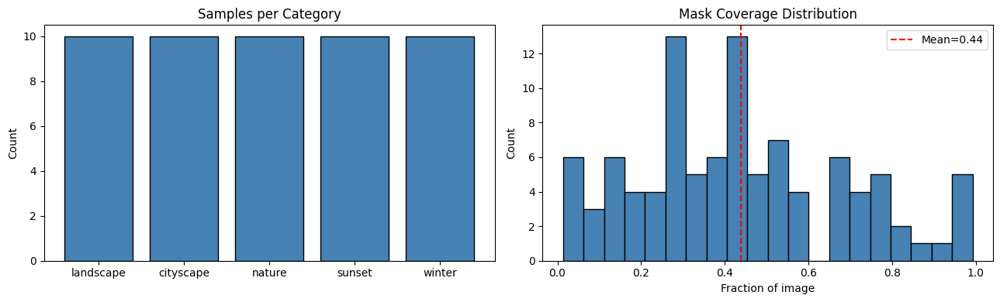

Saved -> /content/benchmark/dataset_index.json
Saved -> /content/benchmark/dataset_summary.png


In [9]:
import matplotlib.pyplot as plt

index = {
    "dataset_name": "MultiRegionStyleTransfer-Bench",
    "version": "1.0",
    "created_at": datetime.now().isoformat(),
    "total_samples": len(dataset_records),
    "categories": list(set(r["category"] for r in dataset_records)),
    "style_references": ["Van Gogh", "Monet", "Picasso", "Feathers"],
    "samples": dataset_records,
}
with open('/content/benchmark/dataset_index.json', 'w') as f:
    json.dump(index, f, indent=2)

success_regions = sum(1 for r in dataset_records for reg in r["regions"] if reg["status"] == "success")
failed_regions = sum(1 for r in dataset_records for reg in r["regions"] if reg["status"] == "failed")
coverages = [reg["mask_coverage"] for r in dataset_records for reg in r["regions"] if reg.get("mask_coverage")]

print(f'Total samples:{len(dataset_records)}')
print(f'Successful regions: {success_regions}')
print(f'Failed regions:{failed_regions}')
print(f'Mean mask coverage:{np.mean(coverages):.3f}')
print(f'Min mask coverage:{np.min(coverages):.3f}')
print(f'Max mask coverage:{np.max(coverages):.3f}')

cats = {}
for r in dataset_records:
    cats[r["category"]] = cats.get(r["category"], 0) + 1

print('\nSamples per category:')
for cat, count in sorted(cats.items()):
    print(f'  {cat}: {count}')

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].bar(cats.keys(), cats.values(), color='steelblue', edgecolor='black')
axes[0].set_title('Samples per Category')
axes[0].set_ylabel('Count')

axes[1].hist(coverages, bins=20, color='steelblue', edgecolor='black')
axes[1].axvline(np.mean(coverages), color='red', linestyle='--', label=f'Mean={np.mean(coverages):.2f}')
axes[1].set_title('Mask Coverage Distribution')
axes[1].set_xlabel('Fraction of image')
axes[1].set_ylabel('Count')
axes[1].legend()

plt.tight_layout()
plt.savefig('/content/benchmark/dataset_summary.png', dpi=150)
plt.show()

print('Saved -> /content/benchmark/dataset_index.json')
print('Saved -> /content/benchmark/dataset_summary.png')

In [10]:
!pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.7 MB/s eta 0:00:00


In [11]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models
import numpy as np
import cv2
import json
import os
from PIL import Image
from datetime import datetime
import lpips
import matplotlib.pyplot as plt

os.makedirs('/content/benchmark/outputs', exist_ok=True)
os.makedirs('/content/benchmark/results', exist_ok=True)

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load dataset index
with open('/content/benchmark/dataset_index.json') as f:
    dataset_index = json.load(f)

# Load style references
style_ref_map = {}
for name in ['Van Gogh', 'Monet', 'Picasso', 'Feathers']:
    path = f'/content/benchmark/styles/{name.replace(" ", "_")}.jpg'
    style_ref_map[name] = Image.open(path).convert('RGB').resize((512, 512), Image.LANCZOS)

print(f'{len(dataset_index["samples"])} samples loaded')
print(f'{len(style_ref_map)} styles loaded')
print(f'Device: {DEVICE}')

50 samples loaded
4 styles loaded
Device: cuda


In [12]:
# VGG19 for NST
vgg = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(DEVICE).eval()
for p in vgg.parameters():
    p.requires_grad_(False)

CONTENT_LAYERS = ['21']
STYLE_LAYERS = ['0', '5', '10', '19', '28']

def get_features(img_t):
    feats, x = {}, img_t
    for name, layer in vgg._modules.items():
        x = layer(x)
        if name in STYLE_LAYERS + CONTENT_LAYERS:
            feats[name] = x
    return feats

def gram(f):
    b, c, h, w = f.shape
    return f.view(c, h * w) @ f.view(c, h * w).t() / (c * h * w)

preprocess = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

def to_tensor(img):
    return preprocess(img).unsqueeze(0).to(DEVICE)

def to_pil(t):
    t = t.squeeze().cpu()
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return T.ToPILImage()((t * std + mean).clamp(0, 1))

def multi_region_nst(content_img, region_styles, steps=200, style_w=1e6, content_w=1.0):
    content_t = to_tensor(content_img)
    target = content_t.clone().requires_grad_(True)
    opt = torch.optim.Adam([target], lr=0.03)
    cf = get_features(content_t)

    region_data = []
    for mask_arr, style_pil in region_styles:
        sf = get_features(to_tensor(style_pil))
        grams = {l: gram(sf[l]) for l in STYLE_LAYERS}
        mask_t = torch.from_numpy((mask_arr > 127).astype(np.float32)).to(DEVICE)
        region_data.append((grams, mask_t))

    for step in range(steps):
        opt.zero_grad()
        tf = get_features(target)
        c_loss = content_w * ((tf['21'] - cf['21']) ** 2).mean()
        s_loss = torch.tensor(0.0, device=DEVICE)
        for grams, mask_t in region_data:
            s_loss = s_loss + style_w * sum(
                ((gram(tf[l]) - grams[l]) ** 2).mean() for l in STYLE_LAYERS
            ) * mask_t.mean()
        (c_loss + s_loss).backward()
        opt.step()

    return to_pil(target)

def feathered_blend(result_img, content_img, mask1, mask2, band_px=20):
    result_arr = np.array(result_img.convert('RGB')).astype(np.float32)
    content_arr = np.array(content_img.convert('RGB')).astype(np.float32)
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px * 2 + 1, band_px * 2 + 1))
    dilated1 = cv2.dilate(mask1, k)
    dilated2 = cv2.dilate(mask2, k)
    band = cv2.bitwise_and(dilated1, dilated2)
    dist = cv2.distanceTransform(band, cv2.DIST_L2, 5)
    if dist.max() > 0:
        dist = dist / dist.max()
    alpha = (dist * 0.5)[..., np.newaxis]
    blended = (result_arr * (1 - alpha) + content_arr * alpha).clip(0, 255).astype(np.uint8)
    return Image.fromarray(blended)

loss_fn = lpips.LPIPS(net='alex').to(DEVICE)

def boundary_band_lpips(original, stylised, mask, band_px=15):
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px * 2 + 1, band_px * 2 + 1))
    band = cv2.subtract(cv2.dilate(mask, k), cv2.erode(mask, k))
    bt = torch.from_numpy((band > 127).astype(np.float32)).to(DEVICE)

    def to_t(img):
        arr = np.array(img.convert('RGB')).astype(np.float32) / 127.5 - 1.0
        return torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to(DEVICE) * bt

    with torch.no_grad():
        return loss_fn(to_t(original), to_t(stylised)).item()

print('Core functions ready')

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:10<00:00, 53.4MB/s]


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:02<00:00, 91.1MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
Core functions ready


In [13]:
all_results = []
failed = []

for idx, sample in enumerate(dataset_index['samples']):
    sid = sample['id']
    out_path = f'/content/benchmark/outputs/{sid}.png'
    res_path = f'/content/benchmark/results/{sid}.json'

    if os.path.exists(res_path):
        with open(res_path) as f:
            all_results.append(json.load(f))
        print(f'{sid} already done, skipping')
        continue

    if not os.path.exists(sample['image_path']):
        print(f'{sid} image missing')
        failed.append(sid)
        continue

    print(f'\n[{idx+1}/{len(dataset_index["samples"])}] {sid}—{sample["instruction"]}')

    try:
        content_img=Image.open(sample['image_path']).convert('RGB').resize((512, 512), Image.LANCZOS)

        # Build region_styles list from saved masks
        region_styles = []
        valid_regions = []
        for reg in sample['regions']:
            if reg['status'] != 'success' or not reg.get('mask_path'):
                continue
            if not os.path.exists(reg['mask_path']):
                print(f'mask missing for {reg["name"]}')
                continue
            style_pil = style_ref_map.get(reg['style'])
            if style_pil is None:
                print(f'style "{reg["style"]}" not found')
                continue
            mask = np.array(Image.open(reg['mask_path']).convert('L'))
            region_styles.append((mask, style_pil))
            valid_regions.append(reg)

        if not region_styles:
            print(f' no valid regions')
            failed.append(sid)
            continue

        result = multi_region_nst(content_img, region_styles, steps=200)

        # Feather the boundary between regions if we have at least two
        if len(valid_regions) >= 2:
            mask1 = np.array(Image.open(valid_regions[0]['mask_path']).convert('L'))
            mask2 = np.array(Image.open(valid_regions[1]['mask_path']).convert('L'))
            result = feathered_blend(result, content_img, mask1, mask2, band_px=20)

        result.save(out_path)

        metrics = {
            'id': sid,
            'category': sample['category'],
            'instruction': sample['instruction'],
            'regions': [],
        }

        for reg in valid_regions:
            mask = np.array(Image.open(reg['mask_path']).convert('L'))
            score = boundary_band_lpips(content_img, result, mask)
            metrics['regions'].append({
                'name': reg['name'],
                'style': reg['style'],
                'lpips': round(score, 4),
                'coverage': reg['mask_coverage'],
            })
            print(f'{reg["name"]} -> {reg["style"]} | LPIPS={score:.4f}')

        lpips_vals = [r['lpips'] for r in metrics['regions']]
        metrics['mean_lpips'] = round(sum(lpips_vals) / len(lpips_vals), 4)
        print(f'    Mean LPIPS: {metrics["mean_lpips"]}')

        all_results.append(metrics)
        with open(res_path, 'w') as f:
            json.dump(metrics, f, indent=2)

    except Exception as e:
        print(f'    error on {sid}: {e}')
        failed.append(sid)

print(f'\nCompleted: {len(all_results)}/{len(dataset_index["samples"])}')
if failed:
    print(f'Failed: {failed}')


[1/50] L001—style the sky like Van Gogh and the mountains like Monet
sky -> Van Gogh | LPIPS=0.0498
mountains -> Monet | LPIPS=0.1518
    Mean LPIPS: 0.1008

[2/50] L002—style the sky like Picasso and the forest like Van Gogh
sky -> Picasso | LPIPS=0.0417
forest -> Van Gogh | LPIPS=0.0408
    Mean LPIPS: 0.0413

[3/50] L003—style the sky like Monet and the water like Van Gogh
sky -> Monet | LPIPS=0.0384
water -> Van Gogh | LPIPS=0.0576
    Mean LPIPS: 0.048

[4/50] L004—style the sky like Feathers and the mountains like Picasso
sky -> Feathers | LPIPS=0.0248
mountains -> Picasso | LPIPS=0.0768
    Mean LPIPS: 0.0508

[5/50] L005—style the sky like Van Gogh and the forest like Monet
sky -> Van Gogh | LPIPS=0.0974
forest -> Monet | LPIPS=0.1411
    Mean LPIPS: 0.1192

[6/50] L006—style the sky like Picasso and the water like Feathers
sky -> Picasso | LPIPS=0.0310
water -> Feathers | LPIPS=0.0145
    Mean LPIPS: 0.0227

[7/50] L007—style the sky like Monet and the mountains like Van Gogh

Mean LPIPS across dataset: 0.0732
Best  sample: C005  LPIPS=0.0205
Worst sample: S003  LPIPS=0.1777

Mean LPIPS per category:
cityscape: 0.0623  (n=10)
landscape: 0.0685  (n=10)
nature: 0.0773  (n=10)
sunset: 0.0922  (n=10)
winter: 0.0659  (n=10)


/tmp/ipykernel_967/927363351.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(cat_data, labels=cats, patch_artist=True)


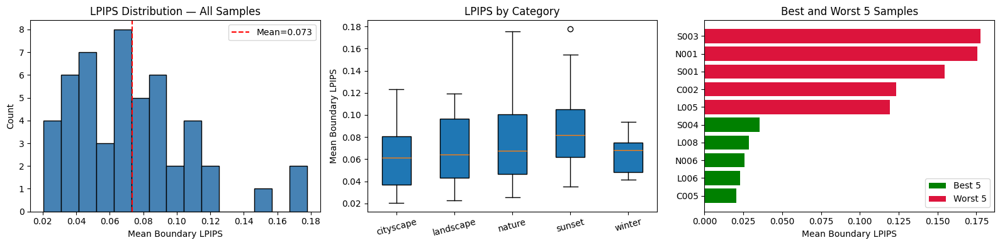

Saved -> /content/benchmark/batch_results.png
Saved -> /content/benchmark/batch_results.csv


In [16]:
import pandas as pd

rows = []
for r in all_results:
    rows.append({
        'id': r['id'],
        'category': r['category'],
        'mean_lpips': r['mean_lpips'],
        'n_regions': len(r['regions']),
    })

df = pd.DataFrame(rows).sort_values('mean_lpips')

print(f'Mean LPIPS across dataset: {df["mean_lpips"].mean():.4f}')
print(f'Best  sample: {df.iloc[0]["id"]}  LPIPS={df.iloc[0]["mean_lpips"]}')
print(f'Worst sample: {df.iloc[-1]["id"]}  LPIPS={df.iloc[-1]["mean_lpips"]}')

print('\nMean LPIPS per category:')
for cat, grp in df.groupby('category'):
    print(f'{cat}: {grp["mean_lpips"].mean():.4f}  (n={len(grp)})')

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

axes[0].hist(df['mean_lpips'], bins=15, color='steelblue', edgecolor='black')
axes[0].axvline(df['mean_lpips'].mean(), color='red', linestyle='--',
                label=f'Mean={df["mean_lpips"].mean():.3f}')
axes[0].set_title('LPIPS Distribution — All Samples')
axes[0].set_xlabel('Mean Boundary LPIPS')
axes[0].set_ylabel('Count')
axes[0].legend()

cats = df['category'].unique()
cat_data = [df[df['category'] == c]['mean_lpips'].values for c in cats]
axes[1].boxplot(cat_data, labels=cats, patch_artist=True)
axes[1].set_title('LPIPS by Category')
axes[1].set_ylabel('Mean Boundary LPIPS')
axes[1].tick_params(axis='x', rotation=15)

top5 = df.head(5)
bot5 = df.tail(5)
axes[2].barh(top5['id'], top5['mean_lpips'], color='green', label='Best 5')
axes[2].barh(bot5['id'], bot5['mean_lpips'], color='crimson', label='Worst 5')
axes[2].set_title('Best and Worst 5 Samples')
axes[2].set_xlabel('Mean Boundary LPIPS')
axes[2].legend()

plt.tight_layout()
plt.savefig('/content/benchmark/batch_results.png', dpi=150)
plt.show()

df.to_csv('/content/benchmark/batch_results.csv', index=False)
print('Saved -> /content/benchmark/batch_results.png')
print('Saved -> /content/benchmark/batch_results.csv')

In [17]:
import shutil
import os

# Bundle everything worth keeping
shutil.make_archive('/content/benchmark_export', 'zip', '/content/benchmark')

print('Saved -> /content/benchmark_export.zip')
print(f'Size: {os.path.getsize("/content/benchmark_export.zip") / 1e6:.1f} MB')

Saved -> /content/benchmark_export.zip
Size: 32.9 MB


In [18]:
import json
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import cv2

all_results = []
for sid in [s['id'] for s in dataset_index['samples']]:
    rpath = f'/content/benchmark/results/{sid}.json'
    if os.path.exists(rpath):
        with open(rpath) as f:
            all_results.append(json.load(f))

print(f'Loaded {len(all_results)} result files')

# 4 failure types from literature survey + experimental results:
#   1 - High boundary leakage:mean LPIPS > 0.10
#   2 - Mask overlap: regions share too many pixels
#   3 - Low mask coverage:region mask covers < 5% of image
#   4 - Style conflict:adjacent contrasting styles + high LPIPS

CONTRASTING_PAIRS = {
    ('Van Gogh', 'Monet'), ('Feathers', 'Picasso'),
    ('Van Gogh', 'Picasso'), ('Feathers', 'Monet'),
}

def classify_failure(result, dataset_index):
    failures = []
    sid = result['id']
    sample = next((s for s in dataset_index['samples'] if s['id'] == sid), None)
    if not sample:
        return failures

    mean_lpips = result['mean_lpips']
    regions = result['regions']

    if mean_lpips > 0.10:
        failures.append({
            'type': 1,
            'label': 'High boundary leakage',
            'description': f'Mean LPIPS={mean_lpips:.4f} exceeds threshold 0.10',
            'severity': 'high' if mean_lpips > 0.14 else 'moderate',
        })

    if len(regions) >= 2:
        mpath1 = next((r['mask_path'] for r in sample['regions'] if r['name'] == regions[0]['name']), None)
        mpath2 = next((r['mask_path'] for r in sample['regions'] if r['name'] == regions[1]['name']), None)
        if mpath1 and mpath2 and os.path.exists(mpath1) and os.path.exists(mpath2):
            m1 = np.array(Image.open(mpath1).convert('L')) > 127
            m2 = np.array(Image.open(mpath2).convert('L')) > 127
            overlap = float((m1 & m2).sum()) / max(m1.sum(), 1)
            if overlap > 0.3:
                failures.append({
                    'type': 2,
                    'label': 'Mask overlap',
                    'description': f'Region masks overlap by {overlap:.1%}',
                    'severity': 'high' if overlap > 0.6 else 'moderate',
                    'overlap': round(overlap, 3),
                })

    for reg in regions:
        if reg['coverage'] < 0.05:
            failures.append({
                'type': 3,
                'label': 'Low mask coverage',
                'description': f'Region "{reg["name"]}" coverage={reg["coverage"]:.3f} < 0.05',
                'severity': 'moderate',
                'region': reg['name'],
            })

    if len(regions) >= 2:
        style_pair = (regions[0]['style'], regions[1]['style'])
        if (style_pair in CONTRASTING_PAIRS or tuple(reversed(style_pair)) in CONTRASTING_PAIRS) \
                and mean_lpips > 0.08:
            failures.append({
                'type': 4,
                'label': 'Style conflict',
                'description': f'Contrasting styles {style_pair} with LPIPS={mean_lpips:.4f}',
                'severity': 'moderate',
            })

    return failures

taxonomy = []
for result in all_results:
    failures = classify_failure(result, dataset_index)
    taxonomy.append({
        'id': result['id'],
        'category': result['category'],
        'mean_lpips': result['mean_lpips'],
        'failures': failures,
        'n_failures': len(failures),
        'is_success': len(failures) == 0,
    })

successes = [t for t in taxonomy if t['is_success']]
fail_cases = [t for t in taxonomy if not t['is_success']]

type_counts = {1: 0, 2: 0, 3: 0, 4: 0}
for t in taxonomy:
    for f in t['failures']:
        type_counts[f['type']] += 1

print(f'Total samples:{len(taxonomy)}')
print(f'Clean successes: {len(successes)} ({len(successes)/len(taxonomy)*100:.0f}%)')
print(f'Failure cases: {len(fail_cases)} ({len(fail_cases)/len(taxonomy)*100:.0f}%)')
print(f'\nType 1 — High boundary leakage: {type_counts[1]} samples')
print(f'Type 2 — Mask overlap:{type_counts[2]} samples')
print(f'Type 3 — Low mask coverage:{type_counts[3]} samples')
print(f'Type 4 — Style conflict:{type_counts[4]} samples')

print('\nWorst cases (LPIPS > 0.12):')
for t in sorted(taxonomy, key=lambda x: x['mean_lpips'], reverse=True)[:8]:
    labels = ', '.join(f['label'] for f in t['failures']) or 'no label'
    print(f'  {t["id"]} ({t["category"]}) LPIPS={t["mean_lpips"]:.4f} -> {labels}')

print('\nBest cases (LPIPS < 0.04):')
for t in sorted(taxonomy, key=lambda x: x['mean_lpips'])[:8]:
    print(f'  {t["id"]} ({t["category"]}) LPIPS={t["mean_lpips"]:.4f}')

Loaded 50 result files
Total samples:50
Clean successes: 24 (48%)
Failure cases: 26 (52%)

Type 1 — High boundary leakage: 10 samples
Type 2 — Mask overlap:13 samples
Type 3 — Low mask coverage:5 samples
Type 4 — Style conflict:14 samples

Worst cases (LPIPS > 0.12):
  S003 (sunset) LPIPS=0.1777 -> High boundary leakage, Mask overlap, Style conflict
  N001 (nature) LPIPS=0.1755 -> High boundary leakage, Mask overlap, Style conflict
  S001 (sunset) LPIPS=0.1544 -> High boundary leakage, Mask overlap, Style conflict
  C002 (cityscape) LPIPS=0.1234 -> High boundary leakage, Style conflict
  L005 (landscape) LPIPS=0.1192 -> High boundary leakage, Style conflict
  L009 (landscape) LPIPS=0.1115 -> High boundary leakage, Low mask coverage, Style conflict
  N003 (nature) LPIPS=0.1092 -> High boundary leakage, Mask overlap
  S002 (sunset) LPIPS=0.1069 -> High boundary leakage, Mask overlap, Style conflict

Best cases (LPIPS < 0.04):
  C005 (cityscape) LPIPS=0.0205
  L006 (landscape) LPIPS=0.022

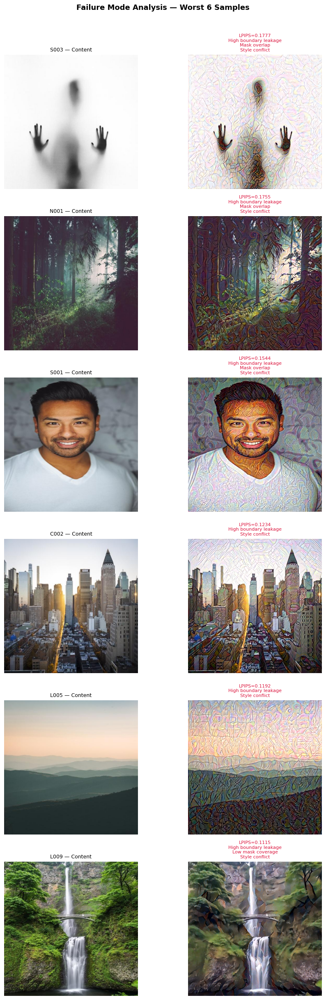

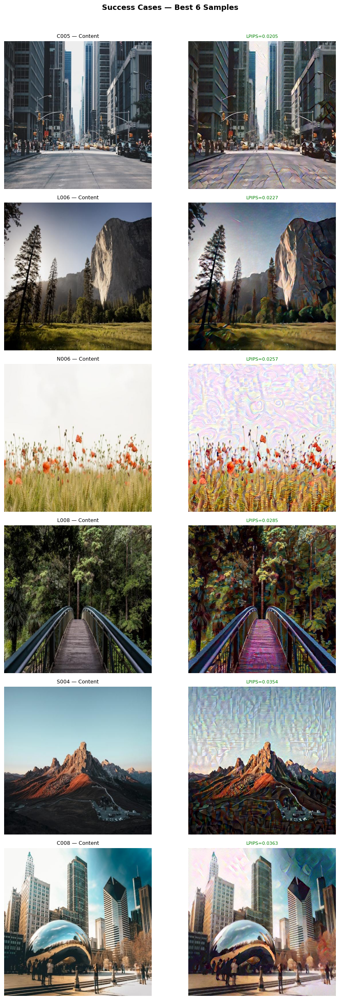

Saved -> /content/benchmark/failure_analysis.png
Saved -> /content/benchmark/success_cases.png


In [19]:
def plot_sample_grid(samples, taxonomy, title, filename, label_fn):
    fig, axes = plt.subplots(len(samples), 2, figsize=(10, len(samples) * 4))
    for row, t in enumerate(samples):
        sid = t['id']
        sample = next(s for s in dataset_index['samples'] if s['id'] == sid)
        out_path = f'/content/benchmark/outputs/{sid}.png'

        content = Image.open(sample['image_path']).convert('RGB').resize((512, 512))
        result = Image.open(out_path).convert('RGB') if os.path.exists(out_path) else content

        axes[row, 0].imshow(content)
        axes[row, 0].set_title(f'{sid} — Content', fontsize=9)
        axes[row, 0].axis('off')

        axes[row, 1].imshow(result)
        lbl, color = label_fn(t)
        axes[row, 1].set_title(lbl, fontsize=8, color=color)
        axes[row, 1].axis('off')

    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(filename, dpi=120, bbox_inches='tight')
    plt.show()

worst6 = sorted(taxonomy, key=lambda x: x['mean_lpips'], reverse=True)[:6]
best6 = sorted(taxonomy, key=lambda x: x['mean_lpips'])[:6]

plot_sample_grid(
    worst6, taxonomy,
    title='Failure Mode Analysis — Worst 6 Samples',
    filename='/content/benchmark/failure_analysis.png',
    label_fn=lambda t: (
        f'LPIPS={t["mean_lpips"]:.4f}\n' + ('\n'.join(f['label'] for f in t['failures']) or 'none'),
        'crimson'
    )
)

plot_sample_grid(
    best6, taxonomy,
    title='Success Cases — Best 6 Samples',
    filename='/content/benchmark/success_cases.png',
    label_fn=lambda t: (f'LPIPS={t["mean_lpips"]:.4f}', 'green')
)

print('Saved -> /content/benchmark/failure_analysis.png')
print('Saved -> /content/benchmark/success_cases.png')

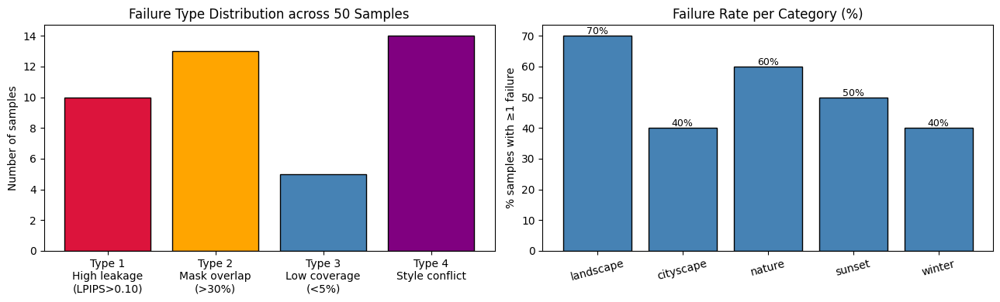

Saved -> /content/benchmark/failure_taxonomy.json
Saved -> /content/benchmark/failure_taxonomy_chart.png

24/50 samples (48%) succeeded with no failure modes


In [20]:
with open('/content/benchmark/failure_taxonomy.json', 'w') as f:
    json.dump(taxonomy, f, indent=2)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

type_labels = [
    'Type 1\nHigh leakage\n(LPIPS>0.10)',
    'Type 2\nMask overlap\n(>30%)',
    'Type 3\nLow coverage\n(<5%)',
    'Type 4\nStyle conflict',
]
axes[0].bar(type_labels, type_counts.values(),
            color=['crimson', 'orange', 'steelblue', 'purple'], edgecolor='black')
axes[0].set_title('Failure Type Distribution across 50 Samples')
axes[0].set_ylabel('Number of samples')

cat_failure = {}
for t in taxonomy:
    c = t['category']
    cat_failure.setdefault(c, {'total': 0, 'failed': 0})
    cat_failure[c]['total'] += 1
    if not t['is_success']:
        cat_failure[c]['failed'] += 1

cats = list(cat_failure.keys())
rates = [cat_failure[c]['failed'] / cat_failure[c]['total'] * 100 for c in cats]
axes[1].bar(cats, rates, color='steelblue', edgecolor='black')
axes[1].set_title('Failure Rate per Category (%)')
axes[1].set_ylabel('% samples with ≥1 failure')
axes[1].tick_params(axis='x', rotation=15)
for i, r in enumerate(rates):
    axes[1].text(i, r + 0.5, f'{r:.0f}%', ha='center', fontsize=9)

plt.tight_layout()
plt.savefig('/content/benchmark/failure_taxonomy_chart.png', dpi=150)
plt.show()

print('Saved -> /content/benchmark/failure_taxonomy.json')
print('Saved -> /content/benchmark/failure_taxonomy_chart.png')
print(f'\n{len(successes)}/{len(taxonomy)} samples ({len(successes)/len(taxonomy)*100:.0f}%) succeeded with no failure modes')

In [21]:
!pip install -q open-clip-torch lpips
print('Dependencies ready')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.8 MB/s eta 0:00:00
Dependencies ready


In [22]:
import torch
import numpy as np
import json
import os
from PIL import Image
import torchvision.transforms as T

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

import open_clip
# ViT-B/32 — lightweight, fits T4 easily
clip_model, _, clip_preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='openai')
clip_model = clip_model.to(DEVICE).eval()
print('CLIP loaded')

dino_model = torch.hub.load('facebookresearch/dino:main', 'dino_vits8')
dino_model = dino_model.to(DEVICE).eval()
dino_transform = T.Compose([
    T.Resize(224),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])
print('DINO loaded')

import lpips
lpips_fn = lpips.LPIPS(net='vgg').to(DEVICE)
print('LPIPS/VGG loaded')

with open('/content/benchmark/dataset_index.json') as f:
    dataset_index = json.load(f)
with open('/content/benchmark/failure_taxonomy.json') as f:
    taxonomy = json.load(f)

style_ref_map = {}
for name in ['Van Gogh', 'Monet', 'Picasso', 'Feathers']:
    path = f'/content/benchmark/styles/{name.replace(" ", "_")}.jpg'
    style_ref_map[name] = Image.open(path).convert('RGB').resize((224, 224), Image.LANCZOS)

print(f'{len(dataset_index["samples"])} samples ready')

Device: cuda


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


CLIP loaded
Downloading: "https://github.com/facebookresearch/dino/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_deitsmall8_pretrain/dino_deitsmall8_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dino_deitsmall8_pretrain.pth


100%|██████████| 82.7M/82.7M [00:00<00:00, 206MB/s]
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DINO loaded
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:09<00:00, 56.9MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS/VGG loaded
50 samples ready


In [23]:
def clip_similarity(img_a, img_b):
    """Cosine similarity between CLIP embeddings. Range [-1,1], higher=better."""
    def embed(img):
        t = clip_preprocess(img.convert('RGB')).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            f = clip_model.encode_image(t)
        return f / f.norm(dim=-1, keepdim=True)
    return (embed(img_a) * embed(img_b)).sum().item()

def dino_similarity(img_a, img_b):
    """Cosine similarity between DINO embeddings. Higher=better content preservation."""
    def embed(img):
        t = dino_transform(img.convert('RGB')).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            f = dino_model(t)
        return f / f.norm(dim=-1, keepdim=True)
    return (embed(img_a) * embed(img_b)).sum().item()

def crop_to_mask(img_pil, mask_arr):
    """Crop image to bounding box of mask."""
    coords = np.argwhere(mask_arr > 127)
    if len(coords) == 0:
        return img_pil
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0)
    return img_pil.crop((x0, y0, x1 + 1, y1 + 1))

def artfid_score(content_img, stylised_img, style_img):
    """
    ArtFID proxy: combines content preservation (LPIPS) + style similarity (CLIP).
    Lower content LPIPS + higher style CLIP = better. Returns combined score in [0,1].
    """
    def to_lpips_t(img):
        arr = np.array(img.convert('RGB').resize((256, 256))).astype(np.float32) / 127.5 - 1.0
        return torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        content_lpips = lpips_fn(to_lpips_t(content_img), to_lpips_t(stylised_img)).item()

    style_clip = clip_similarity(stylised_img, style_img)
    artfid = (style_clip + 1) / 2 * (1 - min(content_lpips, 1))
    return round(artfid, 4), round(content_lpips, 4), round(style_clip, 4)

print('Metric functions ready')

Metric functions ready


In [24]:
import matplotlib.pyplot as plt
import pandas as pd

full_metrics = []
failed = []

for idx, sample in enumerate(dataset_index['samples']):
    sid = sample['id']
    out_path = f'/content/benchmark/outputs/{sid}.png'
    met_path = f'/content/benchmark/results/{sid}_full_metrics.json'

    if os.path.exists(met_path):
        with open(met_path) as f:
            full_metrics.append(json.load(f))
        print(f'  {sid} already computed, skipping')
        continue

    if not os.path.exists(out_path):
        print(f'  {sid} output missing — skipping')
        failed.append(sid)
        continue

    print(f'[{idx+1}/50] {sid}', end='  ')

    try:
        content_img = Image.open(sample['image_path']).convert('RGB').resize((512, 512))
        stylised_img = Image.open(out_path).convert('RGB').resize((512, 512))

        dino_score = dino_similarity(content_img, stylised_img)

        region_metrics = []
        for reg in sample['regions']:
            if reg['status'] != 'success' or not reg.get('mask_path'):
                continue
            if not os.path.exists(reg['mask_path']):
                continue
            style_img = style_ref_map.get(reg['style'])
            if style_img is None:
                continue
            mask = np.array(Image.open(reg['mask_path']).convert('L'))
            region_crop = crop_to_mask(stylised_img, mask)
            clip_score = clip_similarity(region_crop, style_img)
            artfid, c_lpips, _ = artfid_score(content_img, stylised_img, style_img)
            region_metrics.append({
                'name': reg['name'],
                'style': reg['style'],
                'clip_similarity': round(clip_score, 4),
                'artfid': artfid,
                'content_lpips': c_lpips,
            })

        clip_vals = [r['clip_similarity'] for r in region_metrics]
        artfid_vals = [r['artfid'] for r in region_metrics]

        metrics = {
            'id': sid,
            'category': sample['category'],
            'instruction': sample['instruction'],
            'dino_similarity': round(dino_score, 4),
            'mean_clip': round(np.mean(clip_vals), 4) if clip_vals else None,
            'mean_artfid': round(np.mean(artfid_vals), 4) if artfid_vals else None,
            'regions': region_metrics,
        }

        # Merge in boundary LPIPS from the earlier pipeline run
        existing_path = f'/content/benchmark/results/{sid}.json'
        if os.path.exists(existing_path):
            with open(existing_path) as f:
                metrics['mean_boundary_lpips'] = json.load(f).get('mean_lpips')

        full_metrics.append(metrics)
        with open(met_path, 'w') as f:
            json.dump(metrics, f, indent=2)

        print(f'DINO={dino_score:.3f}  CLIP={metrics["mean_clip"]:.3f}  ArtFID={metrics["mean_artfid"]:.3f}')

    except Exception as e:
        print(f'\nerror on {sid}: {e}')
        failed.append(sid)

print(f'\nComputed: {len(full_metrics)}/50  |  Failed: {len(failed)}')

[1/50] L001  DINO=0.504  CLIP=0.682  ArtFID=0.312
[2/50] L002  DINO=0.738  CLIP=0.658  ArtFID=0.490
[3/50] L003  DINO=0.742  CLIP=0.737  ArtFID=0.494
[4/50] L004  DINO=0.792  CLIP=0.646  ArtFID=0.494
[5/50] L005  DINO=0.192  CLIP=0.755  ArtFID=0.197
[6/50] L006  DINO=0.768  CLIP=0.576  ArtFID=0.535
[7/50] L007  DINO=0.657  CLIP=0.723  ArtFID=0.393
[8/50] L008  DINO=0.905  CLIP=0.734  ArtFID=0.548
[9/50] L009  DINO=0.761  CLIP=0.630  ArtFID=0.459
[10/50] L010  DINO=0.552  CLIP=0.717  ArtFID=0.445
[11/50] C001  DINO=0.774  CLIP=0.660  ArtFID=0.527
[12/50] C002  DINO=0.667  CLIP=0.693  ArtFID=0.461
[13/50] C003  DINO=0.773  CLIP=0.591  ArtFID=0.453
[14/50] C004  DINO=0.608  CLIP=0.628  ArtFID=0.422
[15/50] C005  DINO=0.822  CLIP=0.605  ArtFID=0.619
[16/50] C006  DINO=0.878  CLIP=0.719  ArtFID=0.518
[17/50] C007  DINO=0.825  CLIP=0.633  ArtFID=0.560
[18/50] C008  DINO=0.912  CLIP=0.642  ArtFID=0.616
[19/50] C009  DINO=0.661  CLIP=0.713  ArtFID=0.382
[20/50] C010  DINO=0.921  CLIP=0.544  Ar

Full evaluation results — all 4 metrics:
DINO similarity(content preservation): 0.6131
CLIP similarity(style fidelity):  0.6724
ArtFID score (overall quality):0.4148
 Boundary LPIPS(leakage):0.0732

Category           DINO     CLIP   ArtFID    LPIPS
cityscape        0.7840   0.6430   0.5063   0.0623
landscape        0.6612   0.6859   0.4366   0.0685
nature           0.5433   0.6825   0.3871   0.0773
sunset           0.5255   0.6655   0.3401   0.0922
winter           0.5515   0.6852   0.4039   0.0660


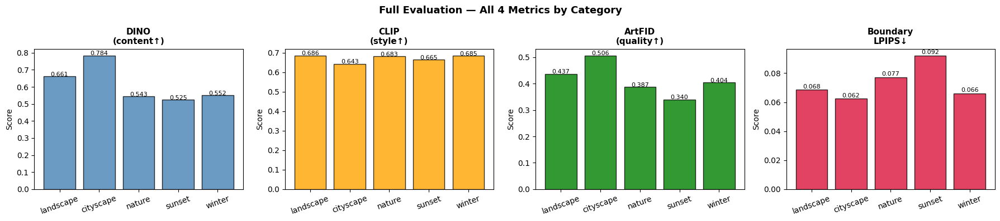

Saved -> /content/benchmark/full_metrics.csv
Saved -> /content/benchmark/full_evaluation.png


In [25]:
rows = []
for m in full_metrics:
    rows.append({
        'id': m['id'],
        'category': m['category'],
        'dino_similarity': m.get('dino_similarity'),
        'mean_clip': m.get('mean_clip'),
        'mean_artfid': m.get('mean_artfid'),
        'mean_boundary_lpips': m.get('mean_boundary_lpips'),
    })

df = pd.DataFrame(rows)

print('Full evaluation results — all 4 metrics:')
print(f'DINO similarity(content preservation): {df["dino_similarity"].mean():.4f}')
print(f'CLIP similarity(style fidelity):  {df["mean_clip"].mean():.4f}')
print(f'ArtFID score (overall quality):{df["mean_artfid"].mean():.4f}')
print(f' Boundary LPIPS(leakage):{df["mean_boundary_lpips"].mean():.4f}')

print(f'\n{"Category":<14} {"DINO":>8} {"CLIP":>8} {"ArtFID":>8} {"LPIPS":>8}')
for cat, grp in df.groupby('category'):
    print(f'{cat:<14} '
          f'{grp["dino_similarity"].mean():>8.4f} '
          f'{grp["mean_clip"].mean():>8.4f} '
          f'{grp["mean_artfid"].mean():>8.4f} '
          f'{grp["mean_boundary_lpips"].mean():>8.4f}')

df.to_csv('/content/benchmark/full_metrics.csv', index=False)

categories = df['category'].unique()
metric_cols = ['dino_similarity', 'mean_clip', 'mean_artfid', 'mean_boundary_lpips']
metric_names = ['DINO\n(content↑)', 'CLIP\n(style↑)', 'ArtFID\n(quality↑)', 'Boundary\nLPIPS↓']
colors = ['steelblue', 'orange', 'green', 'crimson']

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for i, (col, name, color) in enumerate(zip(metric_cols, metric_names, colors)):
    vals = [df[df['category'] == c][col].mean() for c in categories]
    axes[i].bar(categories, vals, color=color, edgecolor='black', alpha=0.8)
    axes[i].set_title(name, fontsize=11, fontweight='bold')
    axes[i].set_ylabel('Score')
    axes[i].tick_params(axis='x', rotation=20)
    for j, v in enumerate(vals):
        axes[i].text(j, v + 0.001, f'{v:.3f}', ha='center', fontsize=8)

plt.suptitle('Full Evaluation — All 4 Metrics by Category', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/benchmark/full_evaluation.png', dpi=150)
plt.show()

print('Saved -> /content/benchmark/full_metrics.csv')
print('Saved -> /content/benchmark/full_evaluation.png')

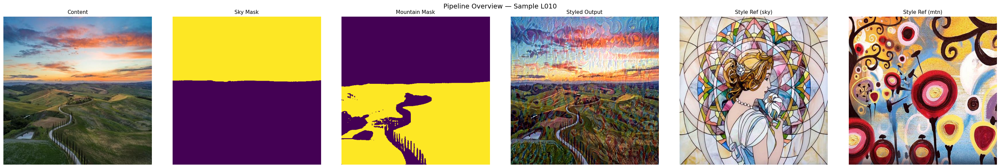

Saved -> /content/benchmark/pipeline_overview.png (6 stages shown)


In [35]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# pick one sample to show the full pipeline stages for that image
sample_id = 'L010'

images = {
    "Content":f"/content/benchmark/content/{sample_id}.jpg",
    "Sky Mask":f"/content/benchmark/masks/{sample_id}_sky.png",
    "Mountain Mask":f"/content/benchmark/masks/{sample_id}_mountains.png",
    "Styled Output":f"/content/benchmark/outputs/{sample_id}.png",
    "Style Ref (sky)":"/content/benchmark/styles/Van_Gogh.jpg",
    "Style Ref (mtn)":"/content/benchmark/styles/Monet.jpg",
}

available, titles = [], []
for title, path in images.items():
    if os.path.exists(path):
        available.append(Image.open(path))
        titles.append(title)
    else:
        print(f"Missing: {path}")

cols = len(available)
plt.figure(figsize=(5 * cols, 5))
for i, (img, title) in enumerate(zip(available, titles), 1):
    plt.subplot(1, cols, i)
    plt.imshow(img)
    plt.title(title, fontsize=11)
    plt.axis("off")

plt.suptitle(f"Pipeline Overview — Sample {sample_id}", fontsize=14)
plt.tight_layout()
plt.savefig('/content/benchmark/pipeline_overview.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved -> /content/benchmark/pipeline_overview.png ({cols} stages shown)")

In [ ]:
import shutil
import os
import zipfile
from datetime import datetime

timestamp = datetime.now().strftime('%Y%m%d_%H%M')
export_path = f'/content/benchmark_full_{timestamp}.zip'

# Everything needed to resume without rerunning from scratch
include = [
    '/content/benchmark/dataset_index.json',
    '/content/benchmark/failure_taxonomy.json',
    '/content/benchmark/full_metrics.csv',
    '/content/benchmark/batch_results.csv',
    '/content/benchmark/content',
    '/content/benchmark/styles',
    '/content/benchmark/masks',
    '/content/benchmark/metadata',
    '/content/benchmark/outputs',
    '/content/benchmark/results',
]

with zipfile.ZipFile(export_path, 'w', zipfile.ZIP_DEFLATED) as zf:
    for path in include:
        if not os.path.exists(path):
            print(f'  skipping (not found): {path}')
            continue
        if os.path.isfile(path):
            zf.write(path, os.path.relpath(path, '/content'))
            print(f'added file: {path}')
        else:
            for root, _, files in os.walk(path):
                for fname in files:
                    fpath = os.path.join(root, fname)
                    zf.write(fpath, os.path.relpath(fpath, '/content'))
            print(f'  added folder: {path} ({sum(len(f) for _, _, f in os.walk(path))} files)')

size_mb = os.path.getsize(export_path) / 1e6
print(f'\nExport ready: {export_path}  ({size_mb:.1f} MB)')

from google.colab import files
files.download(export_path)

  added file: /content/benchmark/dataset_index.json
  added file: /content/benchmark/failure_taxonomy.json
  added file: /content/benchmark/full_metrics.csv
  added file: /content/benchmark/batch_results.csv
  added folder: /content/benchmark/content (50 files)
  added folder: /content/benchmark/styles (4 files)
  added folder: /content/benchmark/masks (100 files)
  added folder: /content/benchmark/metadata (50 files)
  added folder: /content/benchmark/outputs (50 files)
  added folder: /content/benchmark/results (100 files)

Export ready: /content/benchmark_full_20260625_2010.zip  (32.8 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
import os

for root, dirs, files in os.walk('/content'):
    for f in files:
        print(os.path.join(root, f))

/content/gdino_config.py
/content/gdino.pth
/content/benchmark_export.zip
/content/sam_vit_h.pth
/content/.config/gce
/content/.config/.last_opt_in_prompt.yaml
/content/.config/config_sentinel
/content/.config/default_configs.db
/content/.config/hidden_gcloud_config_universe_descriptor_data_cache_configs.db
/content/.config/active_config
/content/.config/.last_survey_prompt.yaml
/content/.config/.last_update_check.json
/content/.config/configurations/config_default
/content/.config/logs/2026.06.04/13.39.22.644527.log
/content/.config/logs/2026.06.04/13.39.24.274402.log
/content/.config/logs/2026.06.04/13.39.12.467650.log
/content/.config/logs/2026.06.04/13.38.54.010366.log
/content/.config/logs/2026.06.04/13.39.37.138439.log
/content/.config/logs/2026.06.04/13.39.36.079406.log
/content/benchmark/success_cases.png
/content/benchmark/dataset_index.json
/content/benchmark/full_evaluation.png
/content/benchmark/batch_results.csv
/content/benchmark/failure_taxonomy_chart.png
/content/benchm